# Imports

The first step is to import important modules and some datasets.

In [2]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import warnings
import collections
from sklearn.impute import KNNImputer
from sklearn.linear_model import Lasso, Ridge, LassoCV, RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import mean_squared_error
import xgboost as xgb
import shap
from lime import lime_tabular
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
from vega_datasets import data
import altair as alt
from IPython.display import display

pd.set_option('display.max_colwidth', None)
np.random.seed(222)
random.seed(222)
warnings.filterwarnings("ignore")


data = pd.read_csv('cvrm_master.csv')
data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [3]:
from cleaning_function import *
pd.set_option('display.max_columns', 300)

nhpi = list(include_columns(data, ['obesity']).columns)

for feature_name in nhpi:
    print(feature_name)

White_Single_Race_Female_Percent_of_Obesity_and_Hyperalimentation_In_Total_Deaths_CDC2018_22_x
White_Single_Race_Male_Percent_of_Obesity_and_Hyperalimentation_In_Total_Deaths_CDC2018_22_x
White_Single_Race_Female_Obesity_and_Hyperalimentation_Deaths_Rate_Per_100,000_Residents_CDC2018_22
White_Single_Race_Male_Obesity_and_Hyperalimentation_Deaths_Rate_Per_100,000_Residents_CDC2018_22
White_Single_Race_Female_Obesity_and_Hyperalimentation_Deaths_Counts_CDC2018_22_x
White_Single_Race_Male_Obesity_and_Hyperalimentation_Deaths_Counts_CDC2018_22_x
Asian_Single_Race_Female_Obesity_and_Hyperalimentation_Deaths_Counts_CDC2018_22_x
Asian_Single_Race_Male_Obesity_and_Hyperalimentation_Deaths_Counts_CDC2018_22_x
NHPI_Single_Race_Male_Obesity_and_Hyperalimentation_Deaths_Counts_CDC2018_22_x
NHPI_Single_Race_Female_Obesity_and_Hyperalimentation_Deaths_Counts_CDC2018_22_x
HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021


In [4]:
data[data['NHPI_Single_Race_Male_Obesity_and_Hyperalimentation_Deaths_Counts_CDC2018_22_x'] == 0]

,statecounty_x,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2016,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2017,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2018,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2019,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2020,Highest_PM2.5_Concentration_microgram/m^3_of_Annual_Average_EPA2021,Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2016,Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2017,Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2018,Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2019,Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2020,Percent_Of_Days_With_Level_Of_PM2.5_Exceeding_The_Standard_EPA2021,Populations_Vulnerable_to_Predicted_Surface_Smoke_from_Wildland_Fires_NOAA2020,"AirPollutant: 1,3-butadiene_ug/m^3_EPA2018",AirPollutant: Acetaldehyde_ug/m^3_EPA2017,AirPollutant: Acetaldehyde_ug/m^3_EPA2018,AirPollutant: Benzene_ug/m^3_EPA2017,AirPollutant: Benzene_ug/m^3_EPA2018,AirPollutant: Carbon tetrachloride_ug/m^3_EPA2017,AirPollutant: Carbon tetrachloride_ug/m^3_EPA2018,AirPollutant: Formaldehyde_ug/m^3_EPA2017,AirPollutant: Formaldehyde_ug/m^3_EPA2018,Total_population_16yr_And_Over_For_Work_Commute_ACS2017_21,Total_population_With_Daily_Commute_Less_Than_15min_ACS2017_21,Total_population_With_Daily_Commute_Between_15_60min_ACS2017_21,Total_population_With_Daily_Commute_60min_And_Above_ACS2017_21,Total_population_Percent_With_Daily_Commute_Less_Than_15min_ACS2017_21,Total_population_Percent_With_Daily_Commute_Between_15_60min_ACS2017_21,Total_population_Percent_With_Daily_Commute_60min_And_Above_ACS2017_21,Black_AA_Single_Race_16yr_And_Over_For_Work_Commute_ACS2017_21,Black_AA_Single_Race_With_Daily_Commute_Less_Than_15min_ACS2017_21,Black_AA_Single_Race_With_Daily_Commute_Between_15_60min_ACS2017_21,Black_AA_Single_Race_With_Daily_Commute_60min_And_Above_ACS2017_21,Black_AA_Single_Race_Percent_With_Daily_Commute_Less_Than_15min_ACS2017_21,Black_AA_Single_Race_Percent_With_Daily_Commute_Between_15_60min_ACS2017_21,Black_AA_Single_Race_Percent_With_Daily_Commute_60min_And_Above_ACS2017_21,AIAN_Single_Race_16yr_And_Over_For_Work_Commute_ACS2017_21,AIAN_Single_Race_With_Daily_Commute_Less_Than_15min_ACS2017_21,AIAN_Single_Race_With_Daily_Commute_Between_15_60min_ACS2017_21,AIAN_Single_Race_With_Daily_Commute_60min_And_Above_ACS2017_21,AIAN_Single_Race_Percent_With_Daily_Commute_Less_Than_15min_ACS2017_21,AIAN_Single_Race_Percent_With_Daily_Commute_Between_15_60min_ACS2017_21,AIAN_Single_Race_Percent_With_Daily_Commute_60min_And_Above_ACS2017_21,Asian_Single_Race_16yr_And_Over_For_Work_Commute_ACS2017_21,Asian_Single_Race_With_Daily_Commute_Less_Than_15min_ACS2017_21,Asian_Single_Race_With_Daily_Commute_Between_15_60min_ACS2017_21,Asian_Single_Race_With_Daily_Commute_60min_And_Above_ACS2017_21,Asian_Single_Race_Percent_With_Daily_Commute_Less_Than_15min_ACS2017_21,Asian_Single_Race_Percent_With_Daily_Commute_Between_15_60min_ACS2017_21,Asian_Single_Race_Percent_With_Daily_Commute_60min_And_Above_ACS2017_21,NHPI_Single_Race_16yr_And_Over_For_Work_Commute_ACS2017_21,NHPI_Single_Race_With_Daily_Commute_Less_Than_15min_ACS2017_21,NHPI_Single_Race_With_Daily_Commute_Between_15_60min_ACS2017_21,NHPI_Single_Race_With_Daily_Commute_60min_And_Above_ACS2017_21,NHPI_Multi_Races_16yr_And_Over_For_Work_Commute_ACS2017_21,NHPI_Multi_Races_With_Daily_Commute_Less_Than_15min_ACS2017_21,NHPI_Multi_Races_With_Daily_Commute_Between_15_60min_ACS2017_21,NHPI_Multi_Races_With_Daily_Commute_60min_And_Above_ACS2017_21,White_NH_Single_Race_16yr_And_Over_For_Work_Commute_ACS2017_21,White_NH_Single_Race_With_Daily_Commute_Less_Than_15min_ACS2017_21,White_NH_Single_Race_With_Daily_Commute_Between_15_60min_ACS2017_21,White_NH_Single_Race_With_Daily_Commute_60min_And_Above_ACS2017_21,White_NH_Single_Race_Percent_With_Daily_Commute_Less_Than_1

Some helper functions

In [5]:
def exclude_columns(df: pd.DataFrame, word_lst:list[str])->pd.DataFrame:
    '''
    Exclude all columns in the dataset if they contain specific words
    - df: the dataframe
    - word_lst: list of words to exclude if they are found in any column names
    '''
    df_new:pd.DataFrame = df.loc[:, ~df.columns.str.contains('|'.join(word_lst), case = False)]
    return df_new

def include_columns(df:pd.DataFrame, word_lst:list[str]) -> pd.DataFrame:
    '''
        Include all columns in the dataset if they contain specific words
        - df: the dataframe
        - word_lst: list of words to include if they are found in any column names
    '''
    df_new: pd.DataFrame = df.loc[:, df.columns.str.contains('|'.join(word_lst), case=False)]
    return df_new

def KNN_single_columns_imputation_numeric(df: pd.DataFrame, exclude_columns: list[str] = None, n_neighbors: int = 5)->pd.DataFrame:
    '''
    runs KNN on numeric columns in the DataFrame to handle missing values or other tasks, skipping non-numeric data.

    - df (pd.DataFrame): The input DataFrame.
    - exclude_columns (list[str], optional): A list of column names to exclude from KNN. Default is None.
    - n_neighbors (int): Number of neighbors for KNN. Default is 5.
    '''
    exclude_columns = exclude_columns or []
    numeric_columns = [col for col in df.columns if pd.api.types.is_numeric_dtype(df[col]) and col not in exclude_columns]
    if not numeric_columns:
        return df
    imputer  = KNNImputer(n_neighbors=n_neighbors)
    df_imputed = df.copy()
    df_imputed[numeric_columns] = imputer.fit_transform(df[numeric_columns])
    return df_imputed


def drop_null_columns(df: pd.DataFrame, threshold: float = 0.8, word_lst: list[str] = None) -> pd.DataFrame:
    '''
    Drops columns with a proportion of null values exceeding a given threshold, 
    except for columns containing words from a specified list (case-insensitive).

    - df (pd.DataFrame): The input DataFrame.
    - threshold (float): The proportion of null values above which a column is dropped. Default 0.8.
    - word_lst (list[str]): List of words to exclude columns containing them. Default None.
    '''
    if word_lst is None:
        word_lst = []

    exclude_columns = {
        col for col in df.columns if any(word.lower() in str(col).lower() for word in word_lst)}
    cols_to_drop = []
    for col in df.columns:
        if col not in exclude_columns:
            try:
                null_proportion = df[col].isnull().mean()
                if null_proportion > threshold:
                    cols_to_drop.append(col)
            except Exception as e:
                print(f"Skipping column '{col}' due to error: {e}")

    return df.drop(columns=cols_to_drop, errors='ignore')



# Clean up and general motivations, and also maps


clean up some categorical columns and drop duplicate columns

In [6]:
fips = data['fips']
longitude = data['Longitude']
latitude = data['Latitude']

drop_cols = ['fips', 'Sort [1]', 'FIPS', 'Unnamed: 0', 'Longitude', 'Latitude',
             'Land Area km²', 'Land Area mi²', 'Water Area km²', 'Water Area mi²', 
             'Total Area km²', 'Total Area mi²']
data = data.drop(columns=[col for col in drop_cols if col in data.columns])
data = data.loc[:, ~data.columns.duplicated()]


drop columns with many missings

In [7]:
data_less_nan = drop_null_columns(data, 0.3)
data_less_corr = data_less_nan

data_less_corr.to_csv("NN_Dataset.csv")

clean up all single-race features and apply KNN, there is no white race specific data

In [8]:
all_race = exclude_columns(data_less_corr,['single_race', 'nhpi', 'asian', 'aian', 'black'])
all_race.shape

(3143, 503)

In [9]:
all_race_clean = KNN_single_columns_imputation_numeric(all_race, None, 10)

check out some potential response variables

In [10]:
response_set = include_columns(all_race_clean, ['outcome'])
response_set.isnull().sum()

HealthOutcome_percent_pop_with_highcholesterol_PLACES_BRFSS_2021            0
HealthOutcome_percent_pop_with_stroke_PLACES_BRFSS_2021                     0
HealthOutcome_health_percent_pop_with_depression_PLACES_BRFSS_2021          0
HealthOutcome_percent_pop_with_chronic_kidney_diseases_Places_BRFSS_2021    0
HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021                    0
HealthOutcome_percent_pop_with_asthma_Places_BRFSS_2021                     0
HealthOutcome_percent_pop_with_diagnosed_Diabetes_PLACES_BRFSS_2021         0
HealthOutcome_percent_pop_with_hypertension_PLACES_BRFSS_2021               0
HealthOutcome_percent_pop_with_coronary_heart_diseases_PLACES_BRFSS_2021    0
dtype: int64

making some small datasets for chrolopleth


In [11]:
include_columns(all_race_clean, ['state'])
years_ahead = include_columns(data_less_corr,['2022'])
state_info = fips
state_info

0        1001
1        1003
2        1005
3        1007
4        1009
        ...  
3138    56037
3139    56039
3140    56041
3141    56043
3142    56045
Name: fips, Length: 3143, dtype: int64

Below four cells are for the response variable map

In [12]:
from vega_datasets import data
import altair as alt

us_counties = alt.topo_feature(data.us_10m.url, "counties")


In [13]:

map_data = all_race_clean[['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021']]
map_data['FIPS'] = fips
map_data['Longitude'] = longitude
map_data['Latitude'] = latitude
map_data

,HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021,FIPS,Longitude,Latitude
0,38.9,1001,-86.644490,32.536382
1,37.2,1003,-87.746067,30.659218
2,43.4,1005,-85.405456,31.870670
3,39.6,1007,-87.127148,33.015893
4,37.7,1009,-86.567246,33.977448
...,...,...,...,...
3138,34.3,56037,-108.875676,41.660339
3139,21.7,56039,-110.588102,44.049321
3140,33.3,56041,-110.558947,41.284726
3141,33.6,56043,-107.669052,43.878831


In [14]:
map_data.rename(columns={
    "HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021": "HealthOutcome"}, inplace=True)
map_data

,HealthOutcome,FIPS,Longitude,Latitude
0,38.9,1001,-86.644490,32.536382
1,37.2,1003,-87.746067,30.659218
2,43.4,1005,-85.405456,31.870670
3,39.6,1007,-87.127148,33.015893
4,37.7,1009,-86.567246,33.977448
...,...,...,...,...
3138,34.3,56037,-108.875676,41.660339
3139,21.7,56039,-110.588102,44.049321
3140,33.3,56041,-110.558947,41.284726
3141,33.6,56043,-107.669052,43.878831


In [15]:
import altair as alt
from vega_datasets import data

us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "HealthOutcome:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Percent population Obesity(%)")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data, "FIPS", ["HealthOutcome"])  
).properties(
    width=500,
    height=300,title = 'Graph1: Obesity distribution across US'
).project("albersUsa")
filled_map


alt.Chart(...)

Map for a local variable: heat wave building loss

In [16]:

map_data2 = all_race_clean[['Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020']]
map_data2['FIPS'] = fips
map_data2['Longitude'] = longitude
map_data2['Latitude'] = latitude



map_data2.rename(columns={
    'Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020': "HeatWave"}, inplace=True)
map_data2

,HeatWave,FIPS,Longitude,Latitude
0,2.697100e-10,1001,-86.644490,32.536382
1,6.087870e-10,1003,-87.746067,30.659218
2,2.697100e-10,1005,-85.405456,31.870670
3,2.697100e-10,1007,-87.127148,33.015893
4,2.697100e-10,1009,-86.567246,33.977448
...,...,...,...,...
3138,3.537483e-05,56037,-108.875676,41.660339
3139,3.537483e-05,56039,-110.588102,44.049321
3140,3.537483e-05,56041,-110.558947,41.284726
3141,3.537483e-05,56043,-107.669052,43.878831


In [17]:
import altair as alt
from vega_datasets import data

us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "HeatWave:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Heat Wave Loss Ratio")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data2, "FIPS", ["HeatWave"])  
).properties(
    width=500,
    height=300, title = 'Graph 4: Heat_Wave_Historic_Loss_Ratio_Buildings feature data across US'
).project("albersUsa")
filled_map

alt.Chart(...)

In [18]:

map_data2 = all_race_clean[['Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021']]
map_data2['FIPS'] = fips
map_data2['Longitude'] = longitude
map_data2['Latitude'] = latitude



map_data2.rename(columns={
    'Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021': "Leisure time"}, inplace=True)
map_data2

import altair as alt
from vega_datasets import data

us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "Leisure time:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="percent pop without leisure time")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data2, "FIPS", ["Leisure time"])  
).properties(
    width=500,
    height=300,
).project("albersUsa")
filled_map

alt.Chart(...)

map for another global variable: Percent_Population_In_Production_Transportation_And_Material_Moving_Occupations

In [19]:
map_data3 = all_race_clean[['Percent_Population_In_Production_Transportation_And_Material_Moving_Occupations_ACS2016_20']]
map_data3['FIPS'] = fips
map_data3['Longitude'] = longitude
map_data3['Latitude'] = latitude



map_data3.rename(columns={
    'Percent_Population_In_Production_Transportation_And_Material_Moving_Occupations_ACS2016_20': "Transportation Occupation"}, inplace=True)
map_data3


,Transportation Occupation,FIPS,Longitude,Latitude
0,0.0849,1001,-86.644490,32.536382
1,0.0705,1003,-87.746067,30.659218
2,0.0970,1005,-85.405456,31.870670
3,0.1046,1007,-87.127148,33.015893
4,0.1091,1009,-86.567246,33.977448
...,...,...,...,...
3138,0.1041,56037,-108.875676,41.660339
3139,0.0606,56039,-110.588102,44.049321
3140,0.1022,56041,-110.558947,41.284726
3141,0.1087,56043,-107.669052,43.878831


In [20]:
us_counties = alt.topo_feature(data.us_10m.url, feature="counties")
filled_map = alt.Chart(us_counties).mark_geoshape().encode(
    color=alt.Color(
        "Transportation Occupation:Q",
        scale=alt.Scale(scheme="magma", reverse=True),  
        legend=alt.Legend(title="Transportation Occupation")
    ),
    tooltip=["id:N"]  
).transform_lookup(
    lookup="id",  
    from_=alt.LookupData(map_data3, "FIPS", ["Transportation Occupation"])  ).properties(
    width=500,
    height=300).project("albersUsa")
filled_map

alt.Chart(...)

# Lasso and Ridge Regression

apply standard scaler to independent variables only, and search for the best alphas for lasso and ridge in given range

In [21]:
y = all_race_clean['HealthOutcome_percent_pop_with_obesity_Places_BRFSS_2021']
all_race_no_obe = exclude_columns(all_race_clean, ['healthoutcome'])
x = all_race_no_obe.select_dtypes(include = ['number'])


scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

lasso_cv = LassoCV(alphas=np.logspace(-4, 1, 50), cv=5, random_state=222)
ridge_cv = RidgeCV(alphas=np.logspace(-4, 1, 50), store_cv_values=True)

lasso_cv.fit(x_scaled, y)
ridge_cv.fit(x_scaled, y)
best_alpha_lasso = lasso_cv.alpha_
best_alpha_ridge = ridge_cv.alpha_

print(f'Optimal Lasso: {best_alpha_lasso}')
print(f'Optimal Ridge: {best_alpha_ridge}')





Optimal Lasso: 0.05689866029018299
Optimal Ridge: 10.0


Rank feature importance using lasso and ridge combined, and get a list of top 100, top 50 and top 200 respectively

In [22]:
# finding feature importance and store them

lasso = Lasso(alpha = best_alpha_lasso, random_state= 222)
lasso.fit(x_scaled, y)

ridge = Ridge(alpha = best_alpha_ridge, random_state= 222)
ridge.fit(x_scaled, y)

features = x.columns

lasso_importance = pd.Series(np.abs(lasso.coef_), index = features)
ridge_importance = pd.Series(np.abs(ridge.coef_), index=features)

lasso_importance = lasso_importance.sort_values(ascending =False)
ridge_importance = ridge_importance.sort_values(ascending=False)

print('Lasso Feature Importance:')
print(lasso_importance)
print('\nRidge Feature Importance:')
print(ridge_importance)


top200_lasso = list(lasso_importance.index[:200])
top200_ridge = list(ridge_importance.index[:200])
top100_lasso = list(lasso_importance.index[:100])
top100_ridge = list(ridge_importance.index[:100])
top50_lasso = list(lasso_importance.index[:50])
top50_ridge = list(ridge_importance.index[:50])

Lasso Feature Importance:
Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021    1.478291
percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021              0.954353
Per_Capita_Income_In_the_Past_Year_ACS2016_20                                         0.539093
RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020                             0.509602
Index_For_Environment_With_Access_To_Healthy_Food_2015_17_CHR                         0.323550
                                                                                        ...   
Total_population_Percent_Housing_With_More_than_1_Occupant_Per_Room                   0.000000
Total_population_Percent_Renter_Occupied_Housing_Units                                0.000000
Total_population_Percent_Owner_Occupied_Housing_Units                                 0.000000
Total_population_Occupied_Housing_With_More_than_1_Occupant_Per_Room                  0.000000
Population (2010)       

From the top 50 features from both lasso and ridge outputs, find the top 10 and these will be the top features with the anlysis of these two regressions

In [23]:
#Find common features in top 50 from both Lasso and Ridge
top_features = list(set(top50_lasso) & set(top50_ridge))
feature_ranking = {feature: top50_lasso.index(feature) + top50_ridge.index(feature) for feature in top_features}
top_10_features = sorted(feature_ranking, key=feature_ranking.get)[:10]

top_features_df = pd.DataFrame({'Graph2: Top 10 Features (ranked by Lasso and Ridge)': top_10_features})
top_features_df

,Graph2: Top 10 Features (ranked by Lasso and Ridge)
0,Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021
1,percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021
2,RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020
3,Index_For_Environment_With_Access_To_Healthy_Food_2015_17_CHR
4,Per_Capita_Income_In_the_Past_Year_ACS2016_20
5,API_Civilian_Noninstitutionalized_Population_For_Insurance_Coverage
6,Winter_Weather_Expected_Annual_Loss_Score_NRI2020
7,Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020
8,HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021
9,Tornado_Expected_Annual_Loss_Score_NRI2020


apply a slightly more complex ranking algorithm, where there will be a ranking of top 50 and top 100 features from both regressions. The algorithm will rank based on the least sum of a variable appearing in both lists participating in the ranking, if a variable is high in one list and missing in another a large penalty will be applied, and if two variables appear only in lasso and ridge list, respectively, then the variable appearing only in the ridge list will be prioritized. 

In [24]:
def rank_features(lasso_list, ridge_list, top_n):
    feature_ranking = {}

    for feature in set(lasso_list) | set(ridge_list): 
        rank_lasso = lasso_list.index(feature) if feature in lasso_list else 200  #penalty if missing
        rank_ridge = ridge_list.index(feature) if feature in ridge_list else 200  
        ranking_score = rank_lasso + rank_ridge
        if rank_lasso == rank_ridge:
            ranking_score -= 0.1
        
        feature_ranking[feature] = ranking_score
    return sorted(feature_ranking, key=feature_ranking.get)[:top_n]
top_50_features = rank_features(top100_lasso, top100_ridge, 50)
top_100_features = rank_features(top200_lasso, top200_ridge, 100)


# GWR: Geographically Weighted Regression

Only the top 50 features ranked above will participate in this model

In [25]:
gwr_df = all_race_no_obe[top_50_features]

the geographical columns look great

In [26]:
longitude, latitude

(0       -86.644490
 1       -87.746067
 2       -85.405456
 3       -87.127148
 4       -86.567246
            ...    
 3138   -108.875676
 3139   -110.588102
 3140   -110.558947
 3141   -107.669052
 3142   -104.570020
 Name: Longitude, Length: 3143, dtype: float64,
 0       32.536382
 1       30.659218
 2       31.870670
 3       33.015893
 4       33.977448
           ...    
 3138    41.660339
 3139    44.049321
 3140    41.284726
 3141    43.878831
 3142    43.846213
 Name: Latitude, Length: 3143, dtype: float64)

select the optimal bandwidth and fit the GWR model

In [27]:
coords = np.column_stack((longitude, latitude))
y_numpy = y.values.reshape(-1, 1) 
X = gwr_df

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#select the optimal bandwidth
bandwidth = Sel_BW(coords, y_numpy, X_scaled).search()

# fit gwr model
gwr_model = GWR(coords, y_numpy, X_scaled, bandwidth)
gwr_results = gwr_model.fit()

print(gwr_results.summary())


Model type                                                         Gaussian
Number of observations:                                                3143
Number of covariates:                                                    51

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                          13677.107
Log-likelihood:                                                   -6770.686
AIC:                                                              13643.373
AICc:                                                             13647.157
BIC:                                                             -11222.562
R2:                                                                   0.789
Adj. R2:                                                              0.786

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

print the result of the GWR model, by mean coefficients

In [28]:
mean_coefficients = gwr_results.params.mean(axis=0)


if mean_coefficients.shape[0] == len(X.columns):
    feature_names = X.columns
else:
    feature_names = X.columns if mean_coefficients.shape[0] == len(X.columns) else X.columns[1:]
coef_df = pd.DataFrame({'Feature': feature_names, 'Mean_Coefficient': mean_coefficients[-len(feature_names):]})
coef_df_sorted = coef_df.sort_values(by = 'Mean_Coefficient', ascending = False)

#top 10 positives
top_10_positive = coef_df_sorted.head(10)

# top 10 negatives
top_10_negative = coef_df_sorted.sort_values(by = 'Mean_Coefficient', ascending = True).head(10)

print("Top 10 Positive Features:")
print(top_10_positive)
print("\nTop 10 Negative Features:")
print(top_10_negative)


Top 10 Positive Features:
                                                                     Feature  \
6                            Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020   
30            Total_population_Take_Public_Transportation_To_Work_ACS2017_21   
18                                   Tornado_Exposure_Building_Value_NRI2020   
39               Households_Received_Food_Stamps_In_The_Past_Year_ACS2016_20   
25                                      Wildfire_Exposure_Population_NRI2020   
7         HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021   
0   percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021   
1                  RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020   
26                Population_25yrs_and_over_with_Education_Degree_ACS2016_20   
21                  API_within_A_Mile_of_Park_Facilities_2020_CDC_ehTracking   

    Mean_Coefficient  
6          25.423084  
30          6.271510  
18          2.782141  
3

Generate visulization of mean coefs results for the GWR model

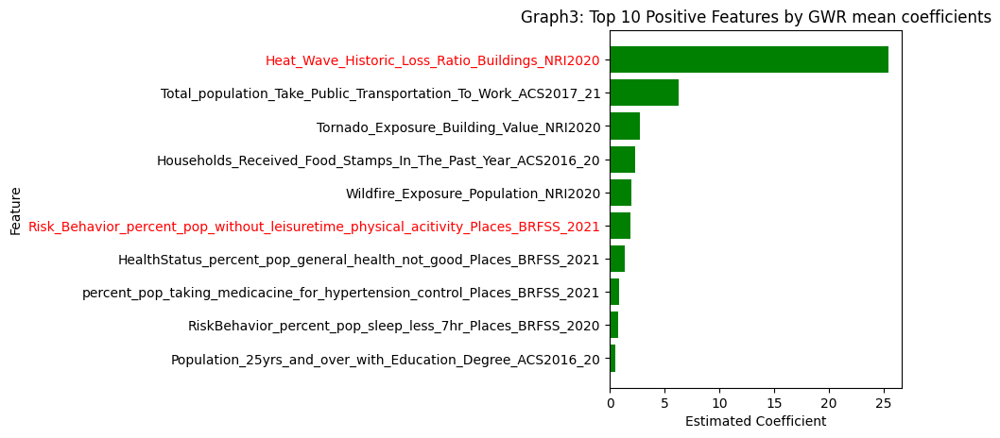

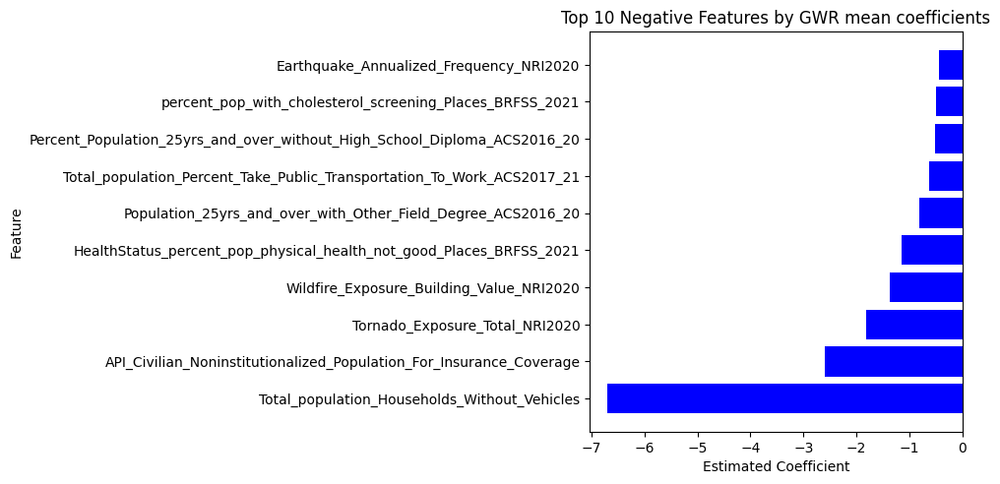

In [29]:
highlight_features = {
    'Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021',
    'Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020'}

feature_names = ['Intercept'] + list(gwr_df.columns)
coef_df = pd.DataFrame({'Feature': feature_names, 'Estimated_Coefficient': mean_coefficients})
coef_df_sorted = coef_df.sort_values(by = 'Estimated_Coefficient', ascending = False)
top_10_positive = coef_df_sorted[coef_df_sorted['Feature'] != 'Intercept'].head(10)
top_10_negative = coef_df_sorted[coef_df_sorted['Feature'] != 'Intercept'].tail(10)




plt.figure(figsize = (10, 5))
plt.barh(top_10_positive['Feature'], top_10_positive['Estimated_Coefficient'], color = 'green')
plt.xlabel('Estimated Coefficient')
plt.ylabel('Feature')
plt.title('Graph3: Top 10 Positive Features by GWR mean coefficients')
plt.gca().invert_yaxis()

ylabels = plt.gca().get_yticklabels()
for label in ylabels:
    feature_name = label.get_text()
    if feature_name in highlight_features:
        label.set_color('red')

plt.tight_layout(pad=2.0)
plt.show()





plt.figure(figsize = (10, 5))
plt.barh(top_10_negative['Feature'], top_10_negative['Estimated_Coefficient'], color = 'blue')
plt.xlabel('Estimated Coefficient')
plt.ylabel('Feature')
plt.title('Top 10 Negative Features by GWR mean coefficients')
plt.gca().invert_yaxis()

ylabels = plt.gca().get_yticklabels()
for label in ylabels:
    feature_name = label.get_text()
    if feature_name in highlight_features:
        label.set_color('red')

plt.tight_layout(pad = 1.0)
plt.show()


# Nonlinear: XGBoost, extreme gradient boost, model

XGBoost does not automatically store original feature names, I have to keep a meta data of the feature names; in addition I am keeping the fips and state of each county data point so that when I do train test split I can do it in a stratified level such that each state would have the same ratio of counties in train and test dataset. 

In [30]:
# I want to make sure all inputs are in correct formats
x_gd = all_race_no_obe[top_100_features]
state = all_race['State']
y_numpy = y.values.reshape(-1, 1) 

x_scaled_gd = scaler.fit_transform(x_gd)
x_scaled_gd = pd.DataFrame(x_scaled_gd, columns=x_gd.columns)
x_scaled_gd['state'] = state
x_scaled_gd['fips'] = fips

y_full_metadata = pd.DataFrame({
    'y': y_numpy.flatten(),  
    'state': x_scaled_gd['state'], 
    'fips': x_scaled_gd['fips']})



In [31]:
X_train, X_test, y_train_metadata, y_test_metadata = train_test_split(
    x_scaled_gd, y_full_metadata, test_size = 0.2, random_state = 222, stratify = y_full_metadata['state']
)
y_train = y_train_metadata['y'].values  
y_test = y_test_metadata['y'].values

X_train_metadata = X_train[['state', 'fips']] 
X_test_metadata = X_test[['state', 'fips']]  

X_train = X_train.drop(columns=['state', 'fips'])
X_test = X_test.drop(columns=['state', 'fips'])

xgb_model = xgb.XGBRegressor(
    verbosity=0,
    objective='reg:squarederror',  
    random_state=222)

# grid search
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300]}

# Set up cross-val
cv = KFold(n_splits=5, shuffle=True, random_state=222)

grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=cv,
    n_jobs=-1)

grid_search.fit(X_train, y_train)
print('Best Parameters:', grid_search.best_params_)
print('Best CV Score (negative MSE):', grid_search.best_score_)

#Evaluate the best model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print('Test MSE:', mse)

Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}
Best CV Score (negative MSE): -3.9972990339327126
Test MSE: 4.231690467774807


# SHAP Analysis

Applying a shap analysis on an XGBoost model is critical because the model itself is opaque so shap helps demystify its predictions. Below I show the top 10 contributing factors to predictions provided by the XGBoost model.

In [32]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)
mean_abs_shap = np.mean(np.abs(shap_values), axis = 0)

top10_impactful_indices = np.argsort(mean_abs_shap)[-10:]
feature_names = X_test.columns

print('\nTop 10 Most Important Features (absolute values ranking):')
for idx in top10_impactful_indices[::-1]:
    print(f'{top_100_features[idx]}: Mean Absolute SHAP = {mean_abs_shap[idx]:.4f}')




Top 10 Most Important Features (absolute values ranking):
Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021: Mean Absolute SHAP = 1.7190
percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021: Mean Absolute SHAP = 0.7527
Earthquake_Annualized_Frequency_NRI2020: Mean Absolute SHAP = 0.3223
HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021: Mean Absolute SHAP = 0.2532
Per_Capita_Income_In_the_Past_Year_ACS2016_20: Mean Absolute SHAP = 0.2489
RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020: Mean Absolute SHAP = 0.2097
Percentage_Children_Eligible_For_Free_Or_Reduced_Price_Lunch_2017_18_CHR: Mean Absolute SHAP = 0.2022
Heat_Wave_Annualized_Frequency_NRI2020: Mean Absolute SHAP = 0.1781
Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020: Mean Absolute SHAP = 0.1685
Total_population_Percent_With_Other_Mean_For_Commute_ACS2017_21: Mean Absolute SHAP = 0.1550


To visualize the mean coefs rankings:

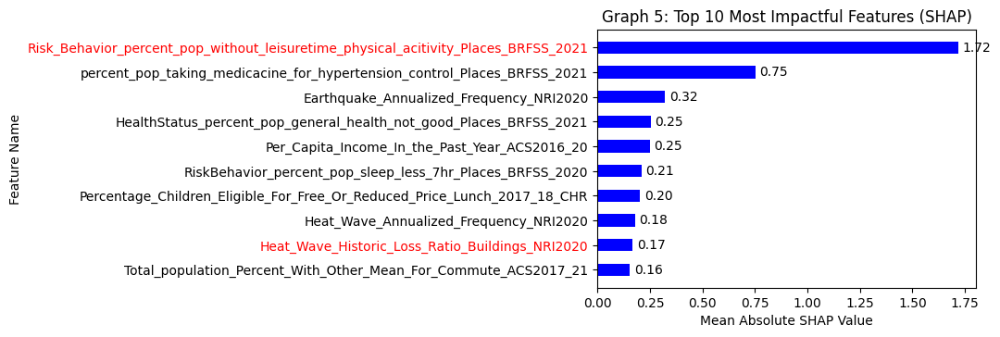

In [33]:
top10_feature_names = [top_100_features[idx] for idx in top10_impactful_indices]
top10_shap_values = mean_abs_shap[top10_impactful_indices] 

sorted_indices = np.argsort(top10_shap_values)[::-1]
top10_feature_names = [top10_feature_names[i] for i in sorted_indices]
top10_shap_values = top10_shap_values[sorted_indices]

plt.figure(figsize = (11, 4))
bars = plt.barh(
    top10_feature_names,
    top10_shap_values,
    color = 'blue',
    height = 0.5)

for bar, value in zip(bars, top10_shap_values):
    plt.text(value + 0.02, bar.get_y() + bar.get_height() / 2, f'{value:.2f}', va = 'center')
plt.xlabel('Mean Absolute SHAP Value')
plt.ylabel('Feature Name')
plt.title('Graph 5: Top 10 Most Impactful Features (SHAP)')



ax = plt.gca()
ax.invert_yaxis()

for label in ax.get_yticklabels():
    if label.get_text() in highlight_features:
        label.set_color('red')
plt.tight_layout(pad = 2.0)
plt.show()


A Beeswarm plot below is showing the same features, but particularly demostrating how they impact predcitions (negative vs. positive) and their variability in the dataset. 

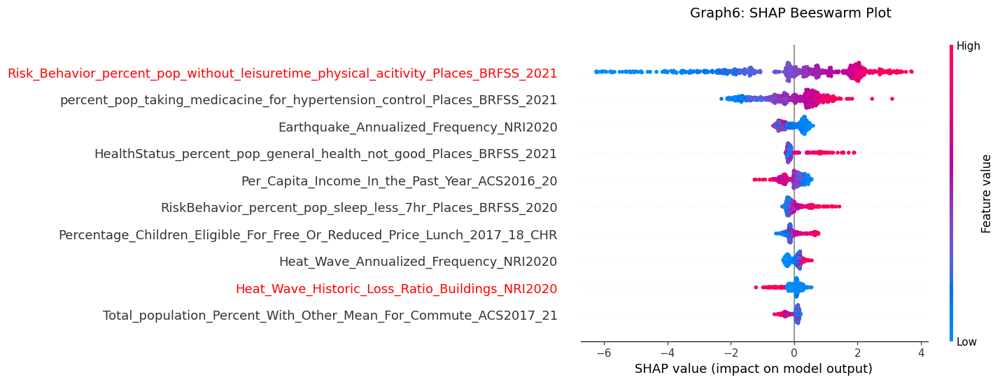

In [34]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)

plt.figure(figsize=(8, 6))
plt.suptitle("Graph6: SHAP Beeswarm Plot", fontsize=14)
shap.summary_plot(
    shap_values,
    X_test,
    feature_names = top_100_features,
    max_display = 10,
    show = False)



ax = plt.gca()
for label in ax.get_yticklabels():
    if label.get_text() in highlight_features:
        label.set_color('red')
plt.show()


# Lime Analysis

since Lime anlysis is great to explain predictions at local levels, which is a single county from my dataset. I want to find some insights about some of the suspected-local variables ranked top globally, and to prove the validity of global features if they appear multiple times across counties from different states. 

In [35]:
# these are the black states from my choropleth of heat wave building loss
states_of_interest = ["ND", "SD", "MT", "WY", "NE", ]

for state in states_of_interest:
    state_indices = X_test_metadata[X_test_metadata['state'] == state].index
    index_to_explain = state_indices[1]
    data_row = X_test.loc[index_to_explain].values
    
    def predict_fn(x):
        return best_model.predict(x)
    #Lime Anlysis
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data = np.array(X_train),
        feature_names = X_train.columns,
        mode = 'regression', 
        discretize_continuous = False)
    exp = explainer.explain_instance(
        data_row,
        predict_fn,
        num_features=10)
    display(exp.show_in_notebook())


NameError: name 'lime' is not defined

Looking at above, most of the random counties (index 1 from test metadata, which I do not know what county that is) generated have the feature heat wave building loss ranked top 10. 

Now for some the states below, they are all from the yellow region, represent heat wave buidling loss at almost 0, from the same choropleth. 

In [ ]:
# these are the yellow states
states_of_interest = ['FL', 'CA', 'PA', 'TX', 'NY', 'NJ', 'GA', 'AK', 'LA','OR']


for state in states_of_interest:
    state_indices = X_test_metadata[X_test_metadata['state'] == state].index
    index_to_explain = state_indices[1]
    data_row = X_test.loc[index_to_explain].values
    def predict_fn(x):
        return best_model.predict(x)
    #Lime Anlysis
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data = np.array(X_train),
        feature_names = X_train.columns,
        mode = 'regression', 
        discretize_continuous = False)
    exp = explainer.explain_instance(
        data_row,
        predict_fn,
        num_features=10)
    display(exp.show_in_notebook())

None

None

None

None

None

None

None

None

None

None

None of them has heat wave building loss as top 10 preditors feature, and again they are random as I do not know what counties are they exactly. 

I want to more clearly see the feature ranking in a random county from a black state, Motana, and a random county from a yellow state, Motana

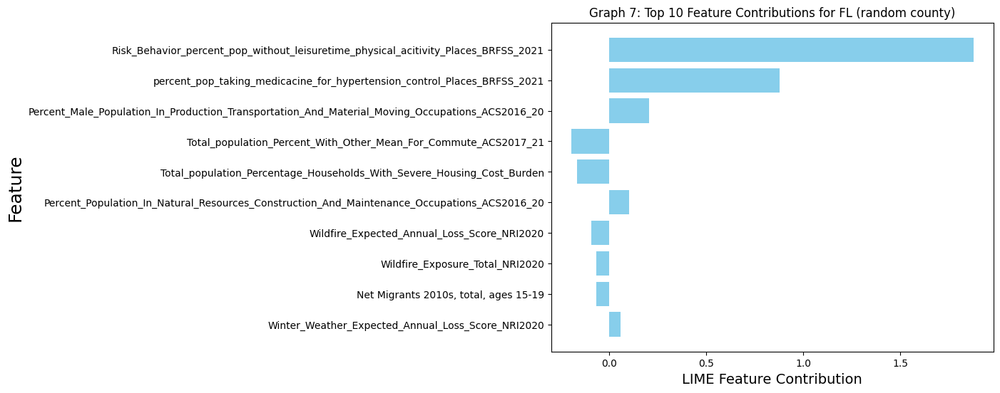

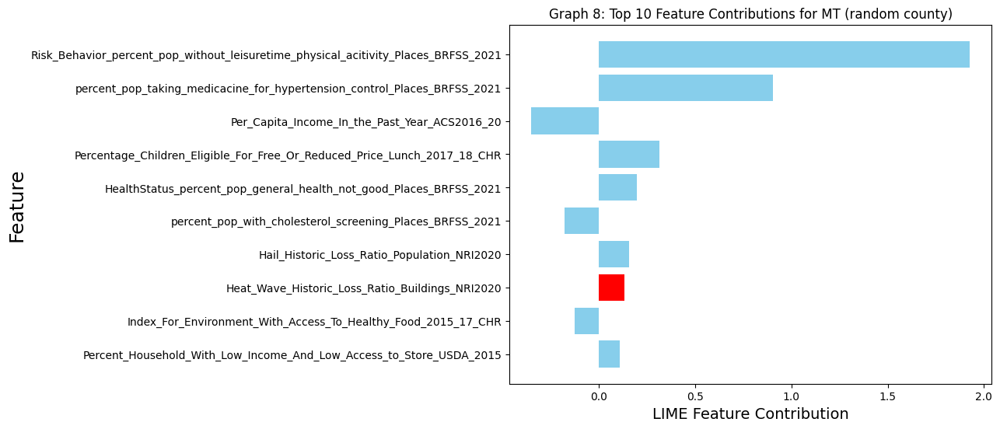

In [ ]:
features_to_label_red = {
    'Heat_Wave_Historic_Loss_Ratio_Buildings_NRI2020'}
states_to_plot = ['FL', 'MT']

for i, state in enumerate(states_to_plot, start=7):  
    state_indices = X_test_metadata[X_test_metadata['state'] == state].index
    index_to_explain = state_indices[1]  
    data_row = X_test.loc[index_to_explain].values

    explainer = lime_tabular.LimeTabularExplainer(
        training_data = np.array(X_train),
        feature_names = X_train.columns,
        mode = 'regression',
        discretize_continuous = False,)

    exp = explainer.explain_instance(
        data_row,
        predict_fn = lambda x: best_model.predict(x),
        num_features = 10,)
    lime_results = exp.as_list()
    features, contributions = zip(*lime_results)

    colors = [
        'red' if feature in features_to_label_red else 'skyblue'
        for feature in features]
    
    plt.figure(figsize = (8, 6))
    plt.barh(features, contributions, color = colors)
    plt.xlabel('LIME Feature Contribution', fontsize = 14)
    plt.ylabel('Feature', fontsize = 18)
    plt.title(f'Graph {i}: Top 10 Feature Contributions for {state} (random county)')
    plt.gca().invert_yaxis()
    plt.show()


I will make a random selection of 50 random counties for LIME analysis below. LIME will be applied to these counties to determine the top five features locally for each one. By counting the frequency with which each feature appears in these top five rankings, I aim to support the argument that some features exert purely local influences, when they appear less often now in contrast to the strong influence they display in the previous models while others have a more global impact, as they appear more frequently even in local analysis. 

In [ ]:
feature_counts = collections.Counter()

n_samples = 50  

sampled_indices = X_test.sample(n = n_samples, random_state = 222).index

for idx in sampled_indices:
    instance = X_test.loc[idx]
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data = X_train.values, 
        feature_names = X_train.columns, 
        mode='regression',
        verbose=False)

    exp = explainer.explain_instance(instance.values, best_model.predict, num_features=5)
    top_features = [f[0] for f in exp.as_list()]
    feature_counts.update(top_features)


sorted_feature_counts = sorted(feature_counts.items(), key = lambda x: x[1], reverse = True)
for feature, count in sorted_feature_counts:
    print(f'{feature}: {count} times')


percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021 > 0.57: 17 times
Earthquake_Annualized_Frequency_NRI2020 <= -0.48: 13 times
Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021 > 0.66: 13 times
Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021 <= -0.68: 12 times
percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021 <= -0.51: 12 times
Per_Capita_Income_In_the_Past_Year_ACS2016_20 > 0.47: 12 times
RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020 > 0.64: 12 times
Earthquake_Annualized_Frequency_NRI2020 > -0.03: 11 times
HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021 > 0.66: 11 times
-0.68 < Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021 <= -0.07: 10 times
-0.07 < Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021 <= 0.66: 10 times
0.07 < percent_pop_taking_medicacine_for_hypertension_cont

Extract the top 15 from the previous results and make them into a dataframe

In [ ]:
highlight_features = {
    'Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021 > 0.66',
    'Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021 <= -0.68',
    '-0.07 < Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021 <= 0.66'}

df_feature_counts = pd.DataFrame(
    sorted(feature_counts.items(), key  = lambda x: x[1], reverse = True),
    columns = ['Graph 7: Feature occurences counts in top 5 importance given a county', 'Count'])
df_top10_features = df_feature_counts.head(15)
def highlight_feature(val):
    return 'color: red' if val in highlight_features else ''



styled_df = df_top10_features.style.applymap(
    highlight_feature,
    subset = ['Graph 7: Feature occurences counts in top 5 importance given a county'])
styled_df


,Graph 7: Feature occurences counts in top 5 importance given a county,Count
0,percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021 > 0.57,17
1,Earthquake_Annualized_Frequency_NRI2020 <= -0.48,13
2,Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021 > 0.66,13
3,Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021 <= -0.68,12
4,percent_pop_taking_medicacine_for_hypertension_control_Places_BRFSS_2021 <= -0.51,12
5,Per_Capita_Income_In_the_Past_Year_ACS2016_20 > 0.47,12
6,RiskBehavior_percent_pop_sleep_less_7hr_Places_BRFSS_2020 > 0.64,12
7,Earthquake_Annualized_Frequency_NRI2020 > -0.03,11
8,HealthStatus_percent_pop_general_health_not_good_Places_BRFSS_2021 > 0.66,11
9,-0.68 < Risk_Behavior_percent_pop_without_leisuretime_physical_acitivity_Places_BRFSS_2021 <= -0.07,10
